In [1]:
!nvidia-smi

Wed Nov  5 12:11:58 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="kPrqeOGvChn2NR1zkARB")
project = rf.workspace("shubham-k8wkg").project("car-plate-number-sxaiz-yuxze")
version = project.version(1)
dataset = version.download("yolov11")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 86.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 134.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Car-plate-number-1 in yolov11:: 100%|██████████| 454/454 [00:00<00:00, 6752.94it/s]


In [3]:
!pip install ultralytics opencv-python-headless matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 28.0 MB/s eta 0:00:00


In [4]:
!pip install ultralytics

In [5]:
from ultralytics import YOLO

base_model = 'yolov8n.pt'

model = YOLO(base_model)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
#train
result = model.train(data='/content/Car-plate-number-1/data.yaml',epochs=30,imgsz=640)

Ultralytics 8.3.225 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Car-plate-number-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tru

In [7]:
# utils.py
import cv2
import numpy as np

def yolo_xywh_to_xyxy(xywh):
    """
    xywh can be:
      - normalized (0..1) values (x_center, y_center, w, h)
      - pixel values (x_center, y_center, w, h)
    We will detect whether coords look normalized (<=1) and convert accordingly.
    Returns ints: xmin, ymin, xmax, ymax
    """
    x_c, y_c, w, h = xywh
    # If values are numpy arrays / tensors
    x_c = float(x_c); y_c = float(y_c); w = float(w); h = float(h)

    # Heuristic: if center and dims <=1 => normalized
    normalized = max(x_c, y_c, w, h) <= 1.0 + 1e-6

    if normalized:
        # caller must supply image shape to scale later; here return normalized xyxy
        xmin = x_c - w/2
        ymin = y_c - h/2
        xmax = x_c + w/2
        ymax = y_c + h/2
        return xmin, ymin, xmax, ymax, True
    else:
        xmin = x_c - w/2
        ymin = y_c - h/2
        xmax = x_c + w/2
        ymax = y_c + h/2
        return int(xmin), int(ymin), int(xmax), int(ymax), False

def draw_boxes(image, boxes, classes=None, scores=None, class_names=None, colors=None):
    """
    boxes: list of [x_center, y_center, w, h] either normalized or pixel
    classes: list of class ids
    scores: list of confidences (optional)
    class_names: list mapping id -> name
    colors: color list or None
    """
    h, w = image.shape[:2]
    if class_names is None:
        class_names = []

    if colors is None:
        # deterministic color palette
        rng = np.random.RandomState(42)
        colors = [tuple(map(int, rng.randint(0, 255, size=3))) for _ in range(max(1, len(class_names)))]

    for i, box in enumerate(boxes):
        xmin, ymin, xmax, ymax, normalized = yolo_xywh_to_xyxy(box)
        if normalized:
            xmin = int(xmin * w)
            ymin = int(ymin * h)
            xmax = int(xmax * w)
            ymax = int(ymax * h)
        # clamp
        xmin, ymin = max(0, xmin), max(0, ymin)
        xmax, ymax = min(w-1, xmax), min(h-1, ymax)

        cls_id = int(classes[i]) if classes is not None else 0
        label = class_names[cls_id] if class_names and cls_id < len(class_names) else f"class_{cls_id}"
        conf_label = f" {scores[i]:.2f}" if (scores is not None) else ""
        text = label + conf_label

        color = colors[cls_id % len(colors)]
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, 2)

        # label background
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.6
        thickness = 1
        (tw, th), _ = cv2.getTextSize(text, font, font_scale, thickness)
        cv2.rectangle(image, (xmin, ymin - th - 6), (xmin + tw + 2, ymin), color, -1)
        cv2.putText(image, text, (xmin + 1, ymin - 4), font, font_scale, (255,255,255), thickness, cv2.LINE_AA)

    return image

In [10]:
from ultralytics import YOLO
import cv2
from IPython.display import Image, display
model = YOLO('/content/runs/detect/train/weights/best.pt')

In [11]:
result = model.predict(source ='/content/Car-plate-number-1/test/images',show=True,save=True)


image 1/22 /content/Car-plate-number-1/test/images/N111_jpeg.rf.8ef69d2947ff001ec0b20e06f3389471.jpg: 512x640 1 0, 8.4ms
image 2/22 /content/Car-plate-number-1/test/images/N11_jpeg.rf.2aea61fc8bd43f4df15fff159ec4c0a5.jpg: 448x640 1 0, 6.9ms
image 3/22 /content/Car-plate-number-1/test/images/N129_jpeg.rf.84c7be8909bbbb6b92601919153045db.jpg: 544x640 1 0, 7.7ms
image 4/22 /content/Car-plate-number-1/test/images/N191_jpeg.rf.e0fefbdee24c3cc84757db12d459a474.jpg: 576x640 1 0, 7.8ms
image 5/22 /content/Car-plate-number-1/test/images/N206_jpeg.rf.30d7b2b689df51d05569944c4255f833.jpg: 448x640 1 0, 6.4ms
image 6/22 /content/Car-plate-number-1/test/images/N212_jpeg.rf.e3fced921287470182151ee9d1e3e6c1.jpg: 352x640 1 0, 6.3ms
image 7/22 /content/Car-plate-number-1/test/images/N231_jpeg.rf.9e3d6c3ccb2065f024f2a809b8a1264c.jpg: 384x640 1 0, 6.3ms
image 8/22 /content/Car-plate-number-1/test/images/N233_jpeg.rf.ca861a3a6d556d7df6dc97b7e710371e.jpg: 384x640 1 0, 5.6ms
image 9/22 /content/Car-plate-nu

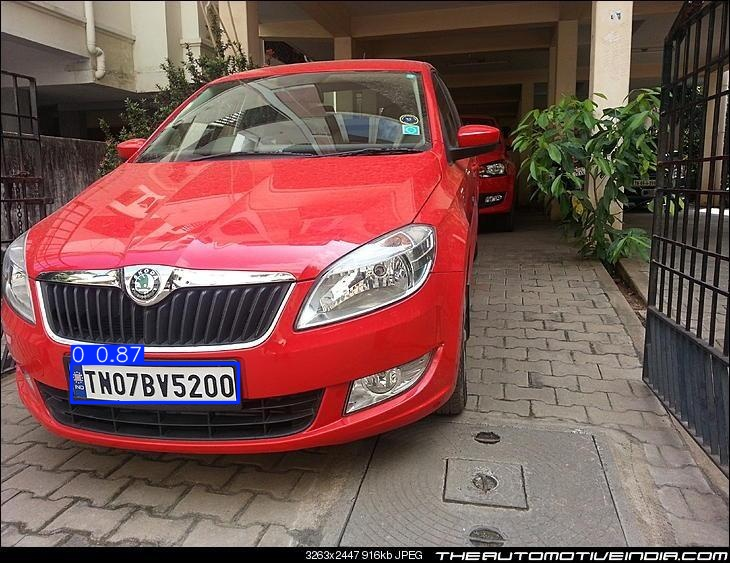

✅ Showing YOLO predicted image: /content/runs/detect/predict2/N111_jpeg.rf.8ef69d2947ff001ec0b20e06f3389471.jpg


In [12]:
from IPython.display import Image,display

image_path ='/content/runs/detect/predict2/N111_jpeg.rf.8ef69d2947ff001ec0b20e06f3389471.jpg'

# Display the image
display(Image(filename=image_path))

print("✅ Showing YOLO predicted image:", image_path)

In [28]:
from google.colab import files

# Upload a video file (e.g., .mp4)
uploaded = files.upload()

# Get the uploaded file name
video_path = list(uploaded.keys())[0]
print("✅ Video uploaded:", video_path)

Saving plate.mp4 to plate.mp4
✅ Video uploaded: plate.mp4


In [2]:
from ultralytics import YOLO

# Example: load trained YOLO model
model = YOLO("/content/runs/detect/train/weights/best.pt")


In [6]:
result = model.predict(source="/content/plate.mp4",save=True,conf=0.2)

print("✅ Video detection complete!")
print("📂 Output saved in:", result[0].save_dir)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/377) /content/plate.mp4: 384x640 2 0s, 67.4ms
video 1/1 (frame 2/377) /content/plate.mp4: 384x640 1 0, 30.6ms
video 1/1 (frame 3/377) /content/plate.mp4: 384x640 1 0, 14.7ms
video 1/1 (frame 4/377) /content/plate.mp4: 384x640 1 0, 8.4ms
video 1/1 (frame 5/377) /content/plate.mp4: 384x640 1 0, 17.7ms
video 1/1 (frame 6/377) /content/plate.mp4: 384x640 1 0, 8.2ms
video 1/1 (frame 7/377) /content/plate.mp4: 384x640 1 0, 18.5ms
video 1/1

In [5]:
!ffmpeg -i /content/runs/detect/predict5/plate.avi -vf "scale=1920:1080" -c:v libx264 -crf 23 /content/runs/detect/predict5/plate.mp4



ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [7]:
from IPython.display import Video
Video("/content/runs/detect/predict5/plate.mp4", embed=True)

